In [1]:
import numpy as np 
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [2]:
tran=pd.read_csv(r'C:\Users\Deepika\Downloads\PYTHON\Transactions.csv')
tran

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,27-02-2014,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,24-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,24-02-2014,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,23-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
23048,94340757522,274550,25-01-2011,12,5,1,1264,132.720,1396.720,e-Shop
23049,89780862956,270022,25-01-2011,4,1,1,677,71.085,748.085,e-Shop
23050,85115299378,271020,25-01-2011,2,6,4,1052,441.840,4649.840,MBR
23051,72870271171,270911,25-01-2011,11,5,3,1142,359.730,3785.730,TeleShop


In [3]:
cust=pd.read_csv(r'C:\Users\Deepika\Downloads\PYTHON\Customer.csv')
cust

,customer_Id,DOB,Gender,city_code
0,268408,02-01-1970,M,4.0
1,269696,07-01-1970,F,8.0
2,268159,08-01-1970,F,8.0
3,270181,10-01-1970,F,2.0
4,268073,11-01-1970,M,1.0
...,...,...,...,...
5642,274474,19-12-1992,M,2.0
5643,267666,24-12-1992,M,6.0
5644,270476,25-12-1992,F,3.0
5645,269626,27-12-1992,F,5.0


In [4]:
prod_info=pd.read_csv(r'C:\Users\Deepika\Downloads\PYTHON\prod_cat_info.csv')
prod_info

,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1,Clothing,4,Mens
1,1,Clothing,1,Women
2,1,Clothing,3,Kids
3,2,Footwear,1,Mens
4,2,Footwear,3,Women
5,2,Footwear,4,Kids
6,3,Electronics,4,Mobiles
7,3,Electronics,5,Computers
8,3,Electronics,8,Personal Appliances
9,3,Electronics,9,Cameras


In [5]:
tran_cust=pd.merge(left=tran,right=cust,how='inner',left_on='cust_id',right_on='customer_Id')
tran_cust

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,customer_Id,DOB,Gender,city_code
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop,270351,26-09-1981,M,5.0
1,80712190438,270351,20-02-2014,1,1,5,772,405.300,4265.300,e-Shop,270351,26-09-1981,M,5.0
2,36957441426,270351,16-09-2013,3,2,3,361,113.715,1196.715,Flagship store,270351,26-09-1981,M,5.0
3,12236277258,270351,18-03-2013,8,3,3,1030,324.450,3414.450,e-Shop,270351,26-09-1981,M,5.0
4,13181563739,270351,13-12-2011,6,5,1,1048,110.040,1158.040,e-Shop,270351,26-09-1981,M,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,16293185603,274931,31-01-2011,8,3,3,137,43.155,454.155,Flagship store,274931,10-06-1972,M,10.0
23049,70163958026,267902,30-01-2011,10,5,4,404,169.680,1785.680,e-Shop,267902,17-07-1975,M,4.0
23050,20417144530,269556,29-01-2011,10,6,3,654,206.010,2168.010,Flagship store,269556,27-12-1972,M,5.0
23051,58531412371,274935,29-01-2011,10,5,4,104,43.680,459.680,Flagship store,274935,09-09-1977,F,3.0


In [6]:
#1
#Final table after combing three tables
customer_final=pd.merge(left=tran_cust,right=prod_info,how='inner',left_on=['prod_subcat_code','prod_cat_code'],right_on=['prod_sub_cat_code','prod_cat_code'])
customer_final

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,customer_Id,DOB,Gender,city_code,prod_cat,prod_sub_cat_code,prod_subcat
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop,270351,26-09-1981,M,5.0,Clothing,1,Women
1,80712190438,270351,20-02-2014,1,1,5,772,405.300,4265.300,e-Shop,270351,26-09-1981,M,5.0,Clothing,1,Women
2,18505840838,271509,16-12-2013,1,1,3,1229,387.135,4074.135,Flagship store,271509,08-06-1981,M,3.0,Clothing,1,Women
3,92814475704,267750,16-08-2013,1,1,-4,-284,119.280,-1255.280,Flagship store,267750,13-10-1986,M,1.0,Clothing,1,Women
4,92814475704,267750,7/8/2013,1,1,4,284,119.280,1255.280,Flagship store,267750,13-10-1986,M,1.0,Clothing,1,Women
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23048,7173864364,271157,9/4/2011,4,4,5,788,413.700,4353.700,Flagship store,271157,15-10-1973,F,6.0,Bags,4,Women
23049,5618131425,272010,3/3/2011,4,4,2,1150,241.500,2541.500,MBR,272010,22-12-1972,F,5.0,Bags,4,Women
23050,18727956164,267161,23-02-2011,4,4,5,668,350.700,3690.700,e-Shop,267161,08-05-1981,M,9.0,Bags,4,Women
23051,60416814232,273281,18-02-2011,4,4,4,202,84.840,892.840,Flagship store,273281,14-12-1988,F,9.0,Bags,4,Women


In [18]:
#creating report on merged dataset i.e customer_final
from pandas_profiling import ProfileReport

In [19]:
profile=ProfileReport(customer_final)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
#2a
customer_final.columns

Index(['transaction_id', 'cust_id', 'tran_date', 'prod_subcat_code',
       'prod_cat_code', 'Qty', 'Rate', 'Tax', 'total_amt', 'Store_type',
       'customer_Id', 'DOB', 'Gender', 'city_code', 'prod_cat',
       'prod_sub_cat_code', 'prod_subcat'],
      dtype='object')

In [29]:
customer_final.dtypes

transaction_id         int64
cust_id                int64
tran_date             object
prod_subcat_code       int64
prod_cat_code          int64
Qty                    int64
Rate                   int64
Tax                  float64
total_amt            float64
Store_type            object
customer_Id            int64
DOB                   object
Gender                object
city_code            float64
prod_cat              object
prod_sub_cat_code      int64
prod_subcat           object
dtype: object

In [7]:
#2b
customer_final.head(10)

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,customer_Id,DOB,Gender,city_code,prod_cat,prod_sub_cat_code,prod_subcat
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop,270351,26-09-1981,M,5.0,Clothing,1,Women
1,80712190438,270351,20-02-2014,1,1,5,772,405.300,4265.300,e-Shop,270351,26-09-1981,M,5.0,Clothing,1,Women
2,18505840838,271509,16-12-2013,1,1,3,1229,387.135,4074.135,Flagship store,271509,08-06-1981,M,3.0,Clothing,1,Women
3,92814475704,267750,16-08-2013,1,1,-4,-284,119.280,-1255.280,Flagship store,267750,13-10-1986,M,1.0,Clothing,1,Women
4,92814475704,267750,7/8/2013,1,1,4,284,119.280,1255.280,Flagship store,267750,13-10-1986,M,1.0,Clothing,1,Women
5,4737317330,269345,29-07-2011,1,1,5,1141,599.025,6304.025,MBR,269345,26-06-1970,F,10.0,Clothing,1,Women
6,44425889101,274987,18-03-2012,1,1,4,897,376.740,3964.740,Flagship store,274987,08-10-1983,M,2.0,Clothing,1,Women
7,90501340928,271817,19-02-2012,1,1,1,1122,117.810,1239.810,TeleShop,271817,24-12-1989,M,8.0,Clothing,1,Women
8,99335419136,268755,13-12-2012,1,1,3,1181,372.015,3915.015,e-Shop,268755,15-07-1984,F,8.0,Clothing,1,Women
9,35030444164,268129,18-11-2011,1,1,5,1047,549.675,5784.675,MBR,268129,07-08-1982,F,9.0,Clothing,1,Women


In [8]:
customer_final.tail(10)

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,customer_Id,DOB,Gender,city_code,prod_cat,prod_sub_cat_code,prod_subcat
23043,3387244829,269114,15-07-2011,4,4,1,388,40.740,428.740,e-Shop,269114,22-01-1989,F,5.0,Bags,4,Women
23044,76906459516,267940,15-06-2011,4,4,2,1263,265.230,2791.230,Flagship store,267940,09-06-1979,M,9.0,Bags,4,Women
23045,73549617163,271334,5/7/2011,4,4,5,263,138.075,1453.075,e-Shop,271334,08-12-1983,F,10.0,Bags,4,Women
23046,75339646315,274827,2/5/2011,4,4,4,1381,580.020,6104.020,e-Shop,274827,27-12-1988,F,8.0,Bags,4,Women
23047,6650926717,268110,5/4/2011,4,4,4,1036,435.120,4579.120,MBR,268110,06-03-1976,M,2.0,Bags,4,Women
23048,7173864364,271157,9/4/2011,4,4,5,788,413.700,4353.700,Flagship store,271157,15-10-1973,F,6.0,Bags,4,Women
23049,5618131425,272010,3/3/2011,4,4,2,1150,241.500,2541.500,MBR,272010,22-12-1972,F,5.0,Bags,4,Women
23050,18727956164,267161,23-02-2011,4,4,5,668,350.700,3690.700,e-Shop,267161,08-05-1981,M,9.0,Bags,4,Women
23051,60416814232,273281,18-02-2011,4,4,4,202,84.840,892.840,Flagship store,273281,14-12-1988,F,9.0,Bags,4,Women
23052,83245680995,273723,26-01-2011,4,4,4,1477,620.340,6528.340,e-Shop,273723,21-01-1984,F,4.0,Bags,4,Women


In [32]:
#2c
customer_final.describe().loc[['min','max','25%','50%','75%'],: ]

,transaction_id,cust_id,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,customer_Id,city_code,prod_sub_cat_code
min,3.268991e+06,266783.0,1.0,1.0,-5.0,-1499.0,7.350,-8270.925,266783.0,1.0,1.0
max,9.998755e+10,275265.0,12.0,6.0,5.0,1500.0,787.500,8287.500,275265.0,10.0,12.0
25%,2.493864e+10,268935.0,3.0,2.0,1.0,312.0,98.280,762.450,268935.0,3.0,3.0
50%,5.009313e+10,270980.0,5.0,4.0,3.0,710.0,199.080,1754.740,270980.0,5.0,5.0
75%,7.533000e+10,273114.0,10.0,5.0,4.0,1109.0,365.715,3569.150,273114.0,8.0,10.0


In [9]:
#2d
#converting dtype for DOB
customer_final.DOB=pd.to_datetime(customer_final.DOB,format='%d-%m-%Y')

In [10]:
# Convert tran_date type to datetime object
def convertDateTime(x):
    x=x.replace('/','-')
    x=pd.to_datetime(x,format='%d-%m-%Y')
    return x


In [11]:
customer_final.tran_date=customer_final.tran_date.apply(lambda x:convertDateTime(x))


In [12]:
def frequency_tables(x):
    plt.figure(figsize=(20,10))
    sns.countplot(x)
    plt.show()

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


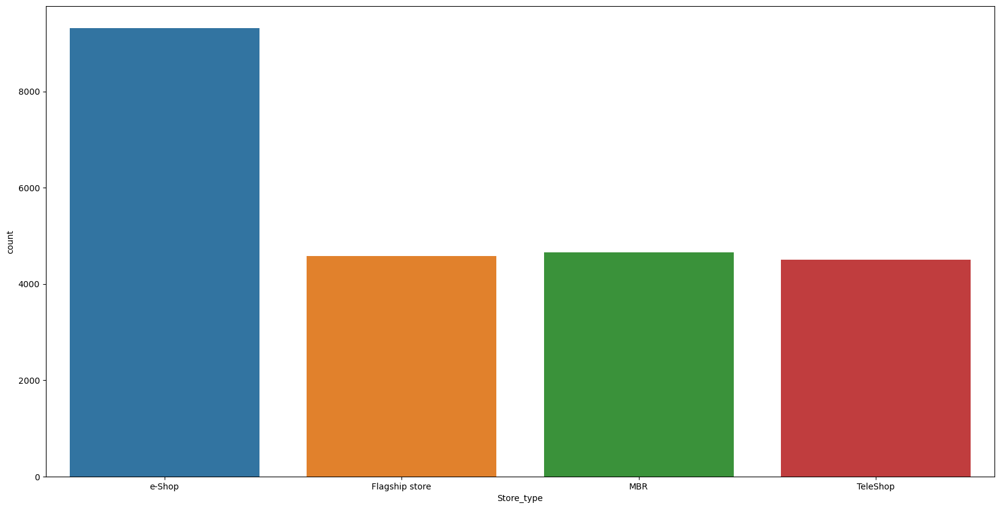

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


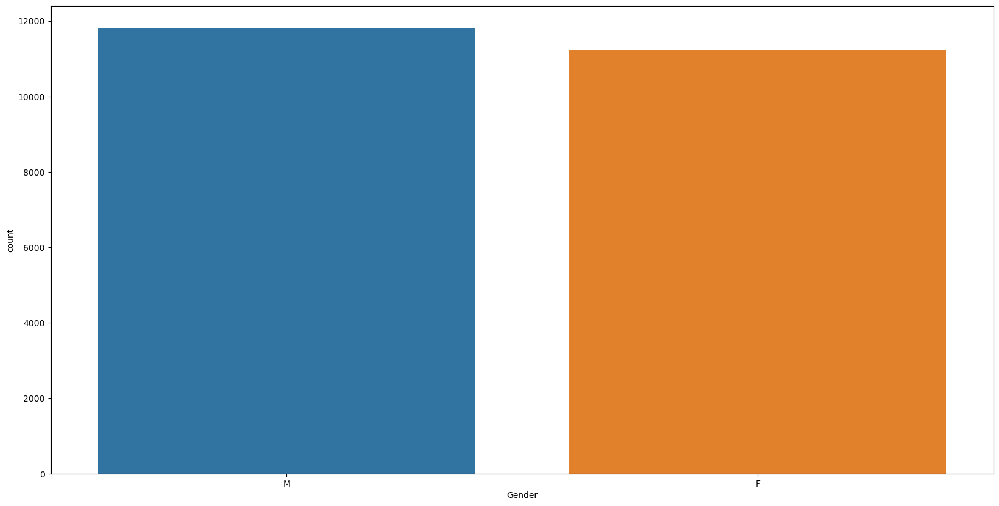

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


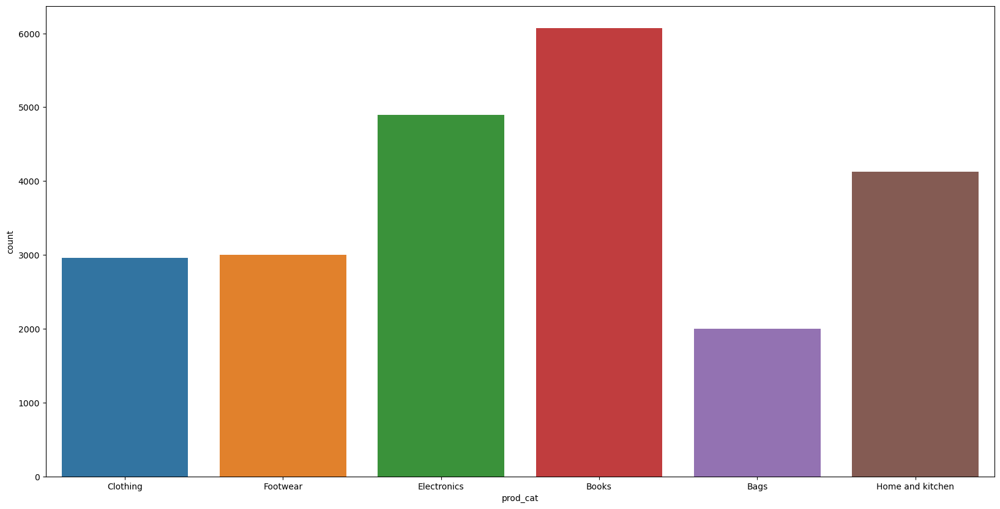

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


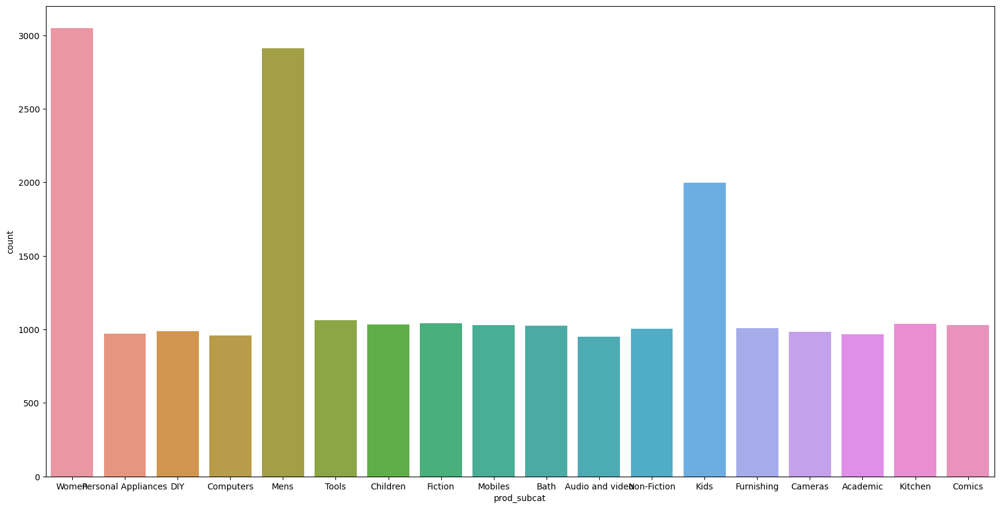

Store_type     None
Gender         None
prod_cat       None
prod_subcat    None
dtype: object

In [13]:
customer_final.select_dtypes(['object']).apply(lambda x: frequency_tables(x))


In [14]:
#3
def continuous_variables(x):
    plt.figure(figsize=(5,4))
    plt.hist(x)
    plt.title('This is a hist for ' + x.name)
    plt.show()

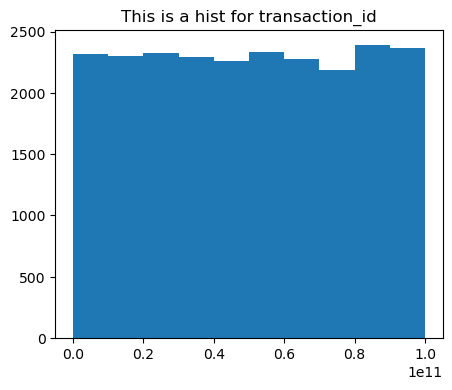

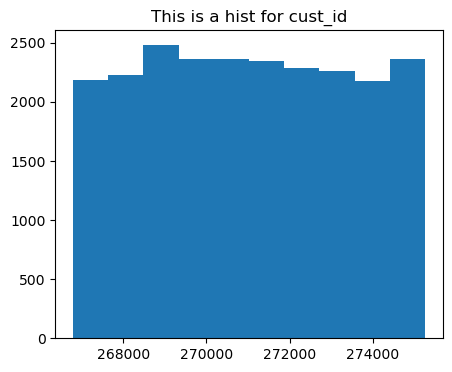

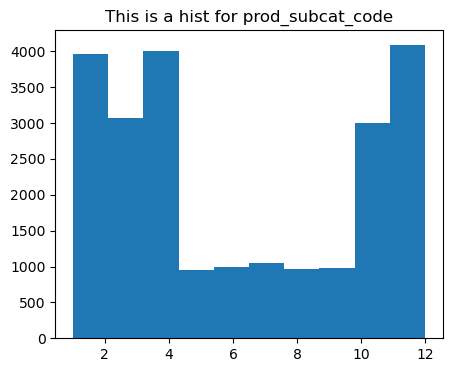

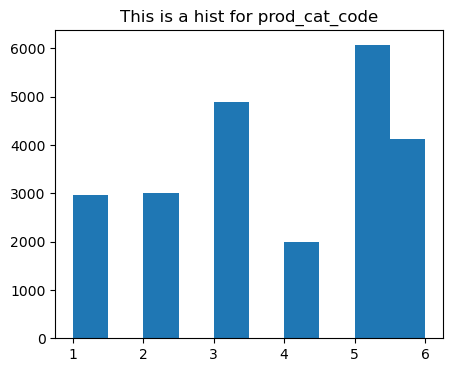

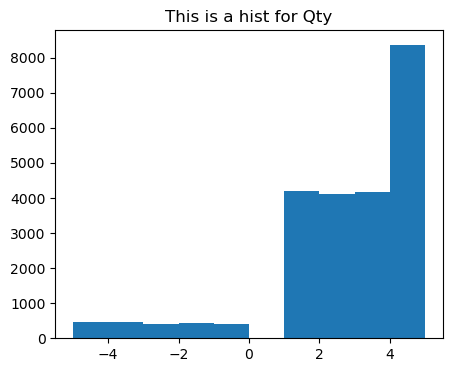

...

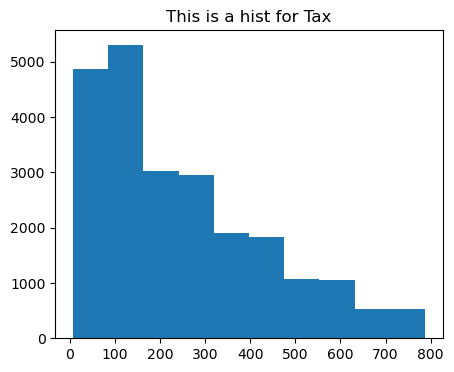

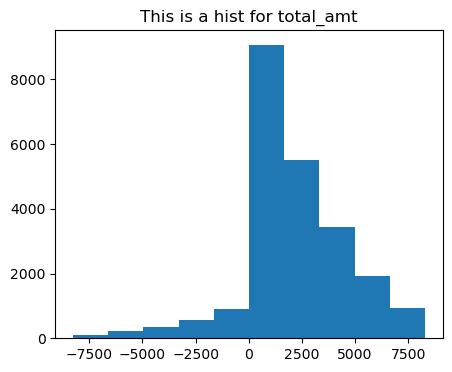

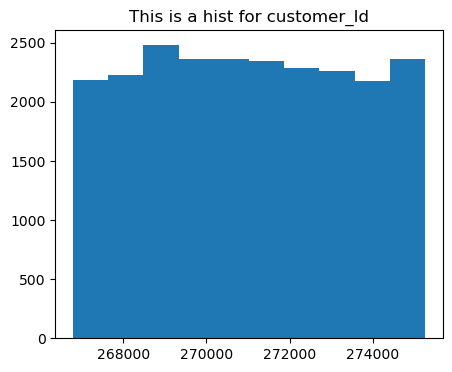

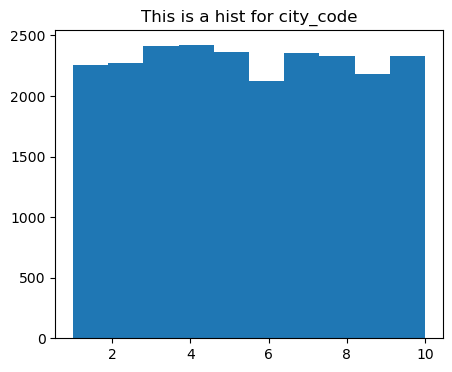

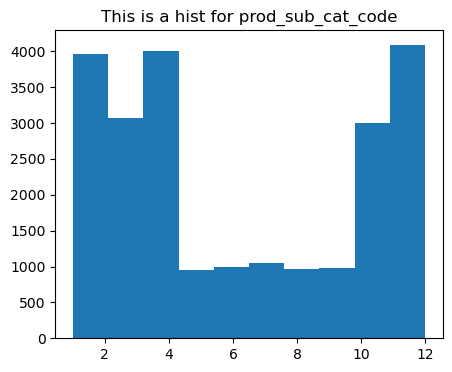

transaction_id       None
cust_id              None
prod_subcat_code     None
prod_cat_code        None
Qty                  None
Rate                 None
Tax                  None
total_amt            None
customer_Id          None
city_code            None
prod_sub_cat_code    None
dtype: object

In [15]:
customer_final.select_dtypes(['int64','float64']).apply(continuous_variables)


C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


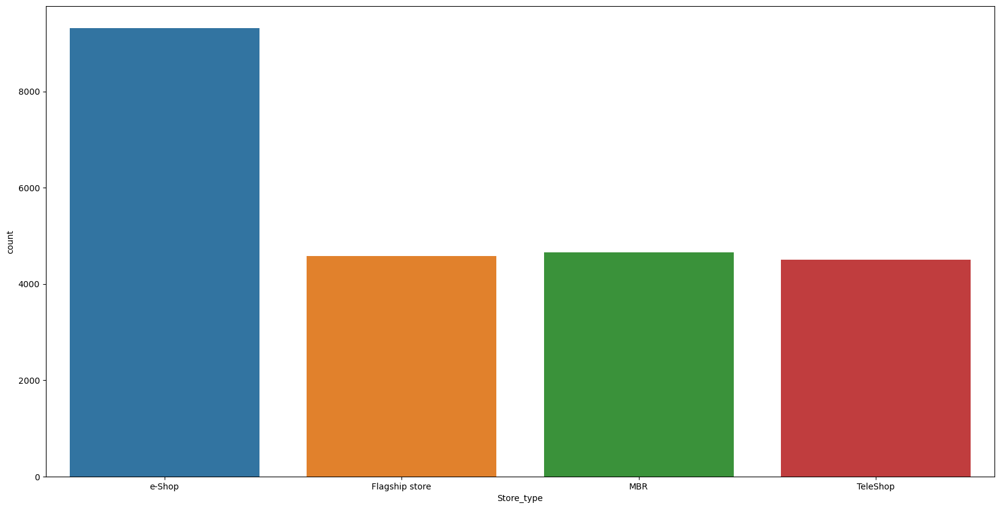

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


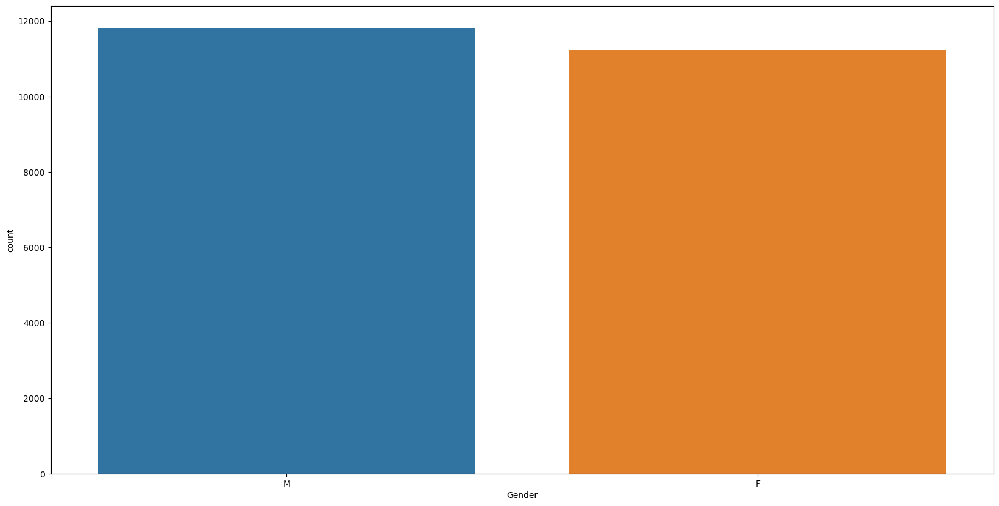

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


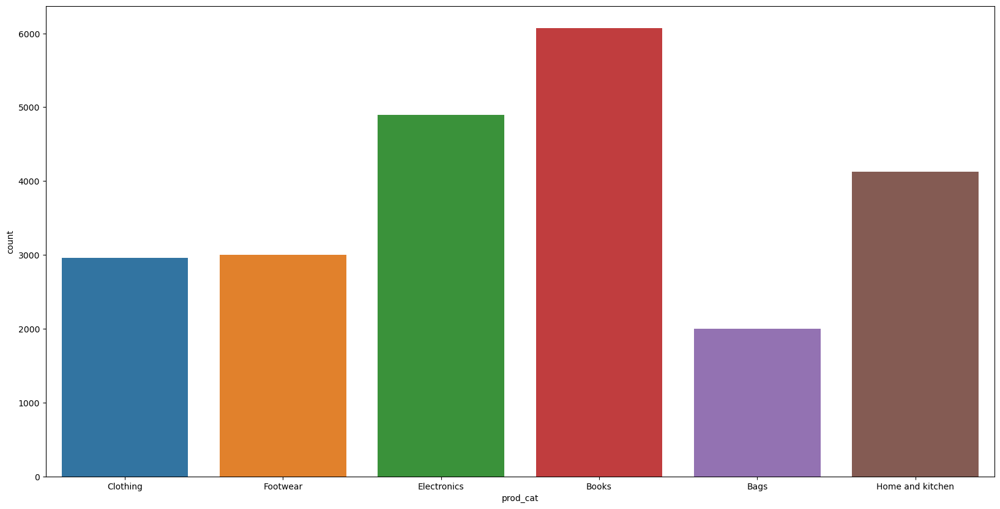

C:\Users\Deepika\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


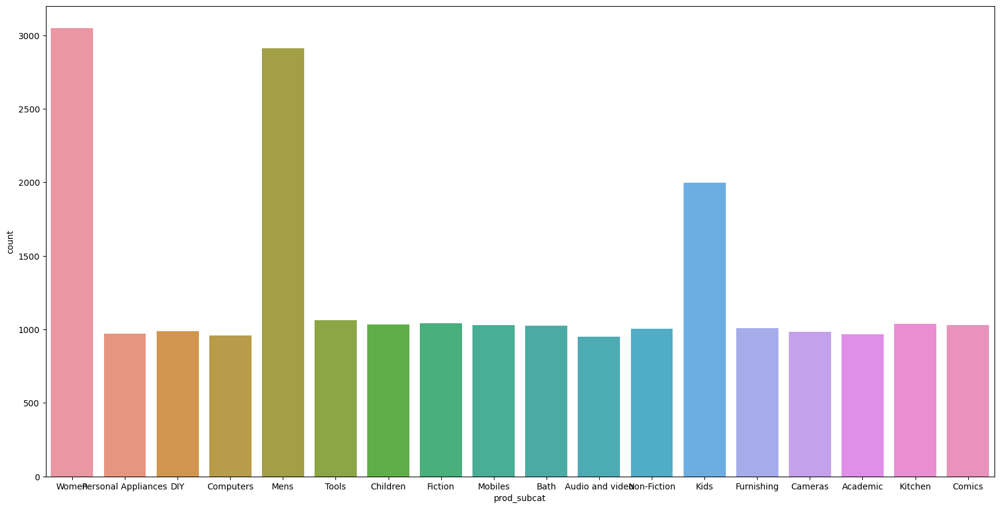

Store_type     None
Gender         None
prod_cat       None
prod_subcat    None
dtype: object

In [16]:
customer_final.select_dtypes(['object']).apply(lambda x: frequency_tables(x))

In [42]:
#4b
len(customer_final.total_amt < 0)

23053

In [44]:
#4a
# Time period of the available transaction data
Max_Available_Date=customer_final.tran_date.max()
Min_Available_Date=customer_final.tran_date.min()
(Max_Available_Date - Min_Available_Date).days


1130

In [102]:
#5
#count of the product category
prod_cat_count=customer_final.groupby(['prod_cat']).agg('count')
prod_cat_count


,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,customer_Id,DOB,Gender,city_code,prod_sub_cat_code,prod_subcat,Age
prod_cat,,,,,,,,,,,,,,,,,
Bags,1998,1998,1998,1998,1998,1998,1998,1998,1998,1998,1998,1998,1998,1997,1998,1998,1998
Books,6069,6069,6069,6069,6069,6069,6069,6069,6069,6069,6069,6069,6065,6068,6069,6069,6069
Clothing,2960,2960,2960,2960,2960,2960,2960,2960,2960,2960,2960,2960,2957,2960,2960,2960,2960
Electronics,4898,4898,4898,4898,4898,4898,4898,4898,4898,4898,4898,4898,4898,4894,4898,4898,4898
Footwear,2999,2999,2999,2999,2999,2999,2999,2999,2999,2999,2999,2999,2998,2999,2999,2999,2999
Home and kitchen,4129,4129,4129,4129,4129,4129,4129,4129,4129,4129,4129,4129,4128,4127,4129,4129,4129


In [103]:
#count of the gender by product category
gender_count=customer_final.groupby(by=['Gender','prod_cat']).agg({'Gender':'count'})
gender_count

Gender
Gender prod_cat                
F      Bags                 994
       Books               2949
       Clothing            1439
       Electronics         2328
       Footwear            1529
       Home and kitchen    1994
M      Bags                1004
       Books               3116
       Clothing            1518
       Electronics         2570
       Footwear            1469
       Home and kitchen    2134

In [105]:
#finding the percentage of gender with respect to product category 
#it is got by gender count by total product count * 100
prod_cat_gender=gender_count.div(prod_cat_count,level='prod_cat')*100
prod_cat_gender.loc[:,'Gender']

Gender  prod_cat        
F       Bags                49.749750
        Books               48.623248
        Clothing            48.664187
        Electronics         47.529604
        Footwear            51.000667
        Home and kitchen    48.304264
M       Bags                50.250250
        Books               51.376752
        Clothing            51.335813
        Electronics         52.470396
        Footwear            48.999333
        Home and kitchen    51.695736
Name: Gender, dtype: float64

In [93]:
#6
#count f customer id by city code then sorting by maximum customers
city_by_maxcust['count_of_cust']=customer_final.groupby(by=['city_code','cust_id']).agg({'cust_id':'count'})
city_by_maxcust=city_by_maxcust.sort_values(by='count_of_cust',ascending=False)
city_by_maxcust

cust_id  count_of_cust
city_code cust_id                        
7.0       268819        13             13
6.0       269449        13             13
          270831        12             12
          274227        12             12
4.0       269245        12             12
...                    ...            ...
8.0       272706         1              1
9.0       267955         1              1
8.0       272614         1              1
2.0       271625         1              1
1.0       266803         1              1

[5504 rows x 2 columns]

In [94]:
#then finding percentage of it by dividing the count of customers to total customers * 100
citypercent_by_maxcust=(city_by_maxcust/(city_by_maxcust.sum()))*100
citypercent_by_maxcust

cust_id  count_of_cust
city_code cust_id                         
7.0       268819   0.056411       0.056411
6.0       269449   0.056411       0.056411
          270831   0.052072       0.052072
          274227   0.052072       0.052072
4.0       269245   0.052072       0.052072
...                     ...            ...
8.0       272706   0.004339       0.004339
9.0       267955   0.004339       0.004339
8.0       272614   0.004339       0.004339
2.0       271625   0.004339       0.004339
1.0       266803   0.004339       0.004339

[5504 rows x 2 columns]

In [60]:
#7
topprod=customer_final.groupby(by=['Store_type','prod_cat'])[['Qty','total_amt']].sum()
topprod.sort_values(by=['Qty','total_amt'],ascending=False).head(1)

,,Qty,total_amt
Store_type,prod_cat,,
e-Shop,Books,5974,5293443.935


In [61]:
#8
store_cat=customer_final.loc[((customer_final.Store_type=='Flagship store') &((customer_final.prod_cat=='Electronics') |(customer_final.prod_cat=='Clothing')))]

In [62]:
store_cat.groupby(by='prod_cat')[['total_amt']].sum()

,total_amt
prod_cat,
Clothing,1194423.23
Electronics,2215136.04


In [63]:
#9
gender_cat=customer_final.loc[((customer_final.Gender=='M') &(customer_final.prod_cat=='Electronics'))]

In [64]:
gender_cat.groupby(by=['Gender','prod_cat'])[['total_amt']].sum()

,,total_amt
Gender,prod_cat,
M,Electronics,5703109.425


In [65]:
#10
positivetotal=customer_final.loc[customer_final.total_amt >0]

In [66]:
cust_tran=positivetotal.groupby(by='cust_id').transaction_id.count().reset_index()

In [67]:
cust_tran.loc[cust_tran.transaction_id > 10]

,cust_id,transaction_id
4,266794,11
2426,270535,11
2606,270803,11
3867,272741,11
4032,273014,11
4815,274227,11


In [68]:
#11a
#converting DOB to age
customer_final['Age']=customer_final.DOB.apply(lambda x: int((dt.datetime.now()-x).days/365))



In [69]:
age_filter=customer_final.loc[(customer_final.Age > 25) & (customer_final.Age < 35)]

In [70]:
age_cat=age_filter.loc[(age_filter.prod_cat=='Electronics') | (age_filter.prod_cat=='Books')]

In [71]:
age_cat.groupby(by=['prod_cat','Age'])[['total_amt']].sum()

total_amt
prod_cat    Age            
Books       29    16604.835
            30   585470.990
            31   530902.775
            32   440145.810
            33   579133.815
            34   530962.445
Electronics 29    11890.905
            30   473163.210
            31   376906.660
            32   420537.585
            33   554852.545
            34   451548.305

In [72]:
#11b
date_filter=age_filter.loc[(age_filter.tran_date > pd.to_datetime("2014-01-01")) & (age_filter.tran_date < pd.to_datetime("2014-03-01"))]


In [73]:
date_filter.groupby(by=['cust_id','tran_date','Age'])[['total_amt']].sum()

total_amt
cust_id tran_date  Age           
266813  2014-01-20 34    1037.595
266841  2014-01-03 31    5047.640
        2014-01-18 31    2648.685
266853  2014-01-26 32    2545.920
266900  2014-02-06 34    1471.860
...                           ...
274844  2014-01-05 33    4954.820
274984  2014-02-02 34    2789.020
275215  2014-01-18 34    5759.260
        2014-01-20 34   -5759.260
275227  2014-02-08 33     987.870

[228 rows x 1 columns]